In [86]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import scipy.special as sc
import copy


import sys
sys.path.append('../Modules')
import Image_Fits_Stats
import Visual_analysis
import seaborn as sns

# Preprocessing

In [4]:
def merge_files(Folder,Name_Images,Name_Labels,split_array):
  images=np.load(Folder+Name_Images+'_{}_{}.npy'.format(split_array[0][0],split_array[0][1]))
  labels=pd.read_csv(Folder+Name_Labels+'_{}_{}.csv'.format(split_array[0][0],split_array[0][1]),index_col=0)
  for i,split in enumerate(split_array[1:]):
    start,stop=split
    images_t=np.load(Folder+Name_Images+'_{}_{}.npy'.format(start,stop))
    labels_t=pd.read_csv(Folder+Name_Labels+'_{}_{}.csv'.format(start,stop),index_col=0)

    images=np.append(images,images_t,axis=0)
    labels=labels.append(labels_t)

  return images,labels

In [5]:
split_array=[(0,5000),(5000,10000),(10000,15000),(15000,20000),(20000,25000),(25000,30000),(30000,35000),(35000,40000),(40000,45000),(45000,50932)]

#galaxies,df=merge_files('../Data/New dataset/','Images_Filtered_new','Labels_Filtered_new',split_array)
#df.reset_index(drop=True,inplace=True)
#df.to_csv('../Final Data/Labels_0_50932.csv')
#np.save('../Final Data/Images_0_50932.npy',galaxies)

In [6]:
df=pd.read_csv('../Final Data/Labels_0_50932.csv',index_col=0)
galaxies=np.load('../Final Data/Images_0_50932.npy')

nonunifomity=np.zeros(len(galaxies))

for i,image in enumerate(galaxies):
    image=copy.deepcopy(image)
    nonunifomity[i]=image.max()/image.mean()

df['Background_size']=df['Background_x_size']*df['Background_y_size']

#df['SNR_Power']=/np.power(df['Noise_std'],2)
#df=df[np.logical_not(np.isnan(df.Sersic_HLR))]

COSMOS_Sersic_columns=['COSMOS_Sersic_I','COSMOS_Sersic_HLR','COSMOS_Sersic_n','COSMOS_Sersic_q',
                'COSMOS_Sersic_x0','COSMOS_Sersic_y0','COSMOS_Sersic_phi']

df['PSNR']=20*np.log10(df['max_I']/df['Noise_sigma'])

df['NonUniformity']=10*np.log10(nonunifomity)

# FIltering

You can see below an overview of the entire dataset and gradual consideration of the filters applied

In [166]:
#Very small objects that do not show any structure, hence appear to be useless
mask_dot_like=((df.NonUniformity>=13) & (df.COSMOS_Sersic_n>=2.5)) | (df.R_cut<21)

#Signal-to-noise ratio filtering
mask_SNR= df.PSNR>=30
mask_NonUniformity= df.NonUniformity<17

Filtering_mask=mask_SNR & mask_NonUniformity & ~mask_dot_like
print(Filtering_mask.sum())

26405


In [167]:
df_filtered=df[Filtering_mask]
Filtered_galaxies=galaxies[df_filtered.index]
df_filtered.reset_index(inplace=True,drop=True)

#Save the data to disk
#df_filtered.to_csv('../Final Data/Labels_MAD_Filtered.csv')
#np.save('../Final Data/Images_MAD_Filtered.npy',Filtered_galaxies)

In [170]:
df.columns

Index(['Angle', 'Background_x_size', 'Background_y_size', 'COSMOS_Bulge_HLR',
       'COSMOS_Bulge_I', 'COSMOS_Bulge_n', 'COSMOS_Bulge_phi',
       'COSMOS_Bulge_q', 'COSMOS_Bulge_x0', 'COSMOS_Bulge_y0',
       'COSMOS_Disk_HLR', 'COSMOS_Disk_I', 'COSMOS_Disk_n', 'COSMOS_Disk_phi',
       'COSMOS_Disk_q', 'COSMOS_Disk_x0', 'COSMOS_Disk_y0',
       'COSMOS_Sersic_HLR', 'COSMOS_Sersic_I', 'COSMOS_Sersic_n',
       'COSMOS_Sersic_phi', 'COSMOS_Sersic_q', 'COSMOS_Sersic_x0',
       'COSMOS_Sersic_y0', 'COSMOS_index', 'COSMOS_noise',
       'COSMOS_use_bulgefit', 'Ellipticity', 'IDENT', 'Noise_median',
       'Noise_sigma', 'Original_R_cut', 'Original_x_size', 'Original_y_size',
       'R_cut', 'Scaling_factor', 'mag_auto', 'max_I', 'min_I', 'zphot',
       'Background_size', 'PSNR', 'NonUniformity'],
      dtype='object')

In [171]:
df_filtered['Scale_without_cut']=64/df.Original_x_size

<ipython-input-171-53ce7c419b53>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Scale_without_cut']=64/df.Original_x_size


In [172]:
import Dataset_overview_filtering as overview
df_filtered.describe().iloc[1:][['PSNR', 'NonUniformity','Background_size','COSMOS_Sersic_n','Scaling_factor','Scale_without_cut']]

,PSNR,NonUniformity,Background_size,COSMOS_Sersic_n,Scaling_factor,Scale_without_cut
mean,38.075449,13.662126,3486.434690,1.198230,0.760309,0.524036
std,6.143725,1.461386,2467.778143,0.547971,0.206238,0.125363
min,30.001222,8.458526,128.000000,0.100000,0.143498,0.080201
25%,33.425633,12.641877,1880.000000,0.773715,0.603774,0.444444
50%,36.899245,13.691568,3200.000000,1.108266,0.780488,0.542373
75%,41.369625,14.707215,4620.000000,1.556813,0.969697,0.615385
max,90.632276,16.998823,153636.000000,4.192797,1.000000,0.780488


# Chi_square

In [174]:
images=copy.deepcopy(Filtered_galaxies)
for i in range(len(images)):
    images[i][images[i]<0]=0
    images[i]/=images[i].max()

0        0.012231
1        0.018711
2        0.012080
3        0.028329
4        0.020119
           ...   
26400    0.025787
26401    0.011440
26402    0.006513
26403    0.015298
26404    0.012704
Length: 26405, dtype: float64

In [178]:
weights=(1/30)**2/(np.power(df_filtered.Noise_sigma/df_filtered.max_I,2))

In [183]:
(df_filtered.Noise_sigma/df_filtered.max_I).median()

0.014290182212516102

In [184]:
(df_filtered.Noise_sigma/df_filtered.max_I).max()

0.03161832965574348

In [185]:
(df_filtered.Noise_sigma/df_filtered.max_I).min()

2.940263010389528e-05

In [180]:
weights.max()

1285242.6527189189

# Dataset overview

In [7]:
import Dataset_overview_filtering as overview
df.describe().iloc[1:][['PSNR', 'NonUniformity','R_cut','Background_size','COSMOS_Sersic_n','Scaling_factor']]

,PSNR,NonUniformity,R_cut,Background_size,COSMOS_Sersic_n,Scaling_factor
mean,39.167833,14.138638,29.927001,4578.823568,1.930777,0.789210
std,9.971261,2.097280,4.064463,5285.866382,1.562668,0.201854
min,16.303141,7.529617,0.000000,128.000000,0.100000,0.143498
25%,31.801284,12.635575,30.000000,1980.000000,0.815071,0.627451
50%,37.721685,14.132525,32.000000,3600.000000,1.302092,0.820513
75%,44.842298,15.567783,32.000000,5336.000000,2.590770,1.000000
max,90.632276,29.675066,32.000000,153636.000000,6.000000,1.000000


## SNR

43472 Galaxies
PSNR [28.00,inf]


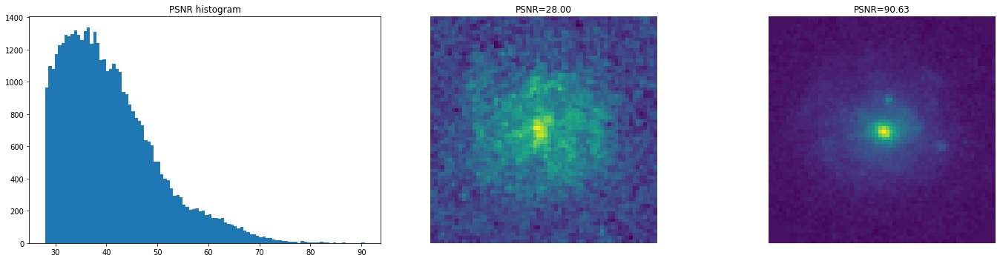

In [150]:
overview.Show_stats(galaxies,df,'PSNR',28,np.inf,2,False,False,False)

43472 Galaxies
PSNR [28.00,inf]


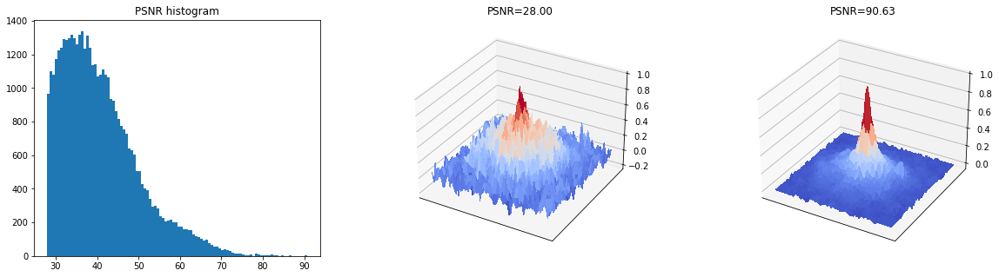

In [151]:
overview.Show_stats(galaxies,df,'PSNR',28,np.inf,3,False,False,False)

PSNR 30.00122153719356
Number of galaxies 26826


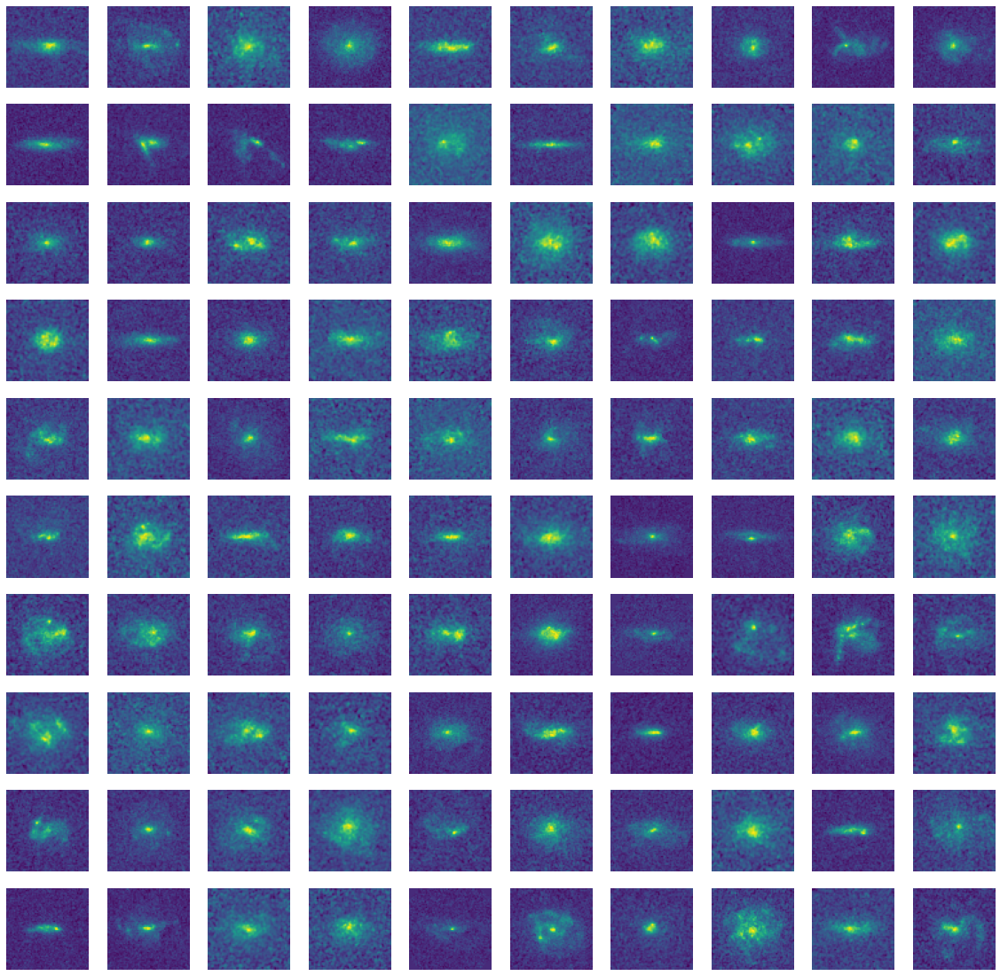

In [155]:
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'PSNR',ascending=True,threshold=30,Index_from=0,invert_colors=False,cut_negatives=False)

PSNR 90.63227639276391
Number of galaxies 48795


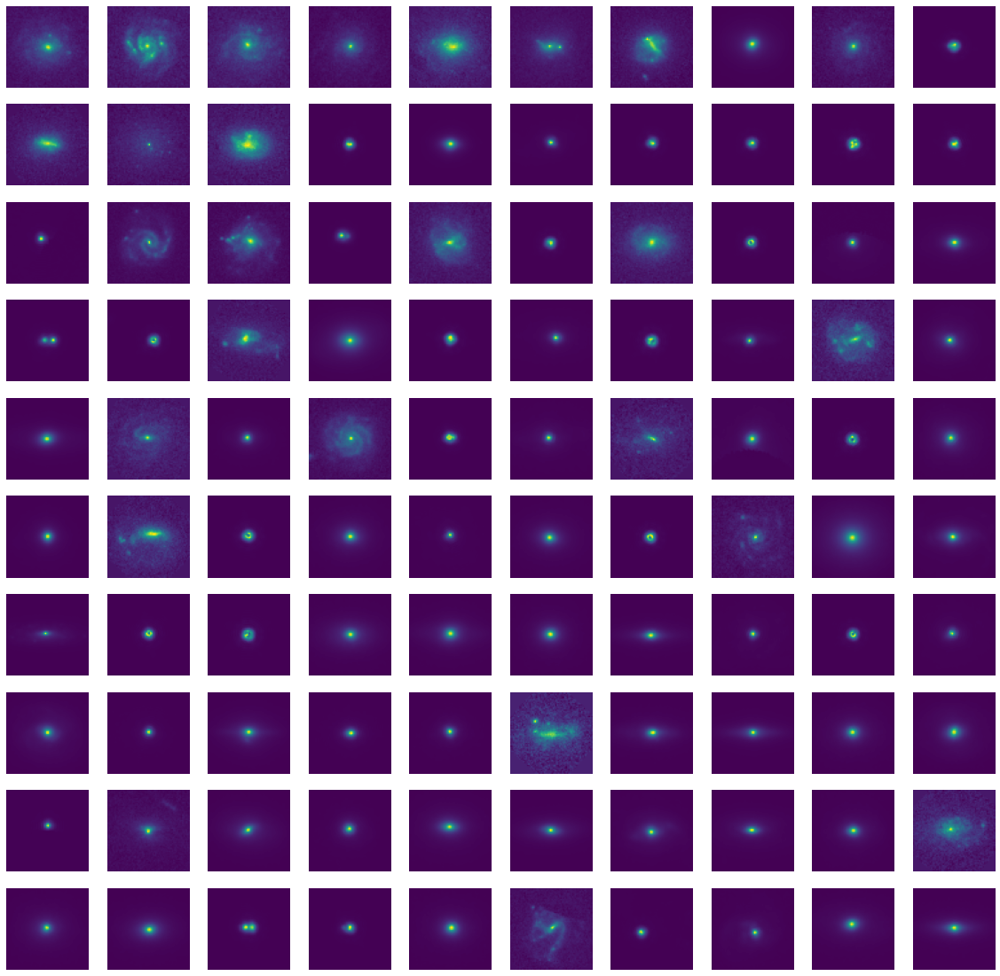

In [11]:
df_filt=overview.Show_filtered(galaxies,df,'PSNR',ascending=False,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

## R_cut

48795 Galaxies
R_cut [0.00,inf]


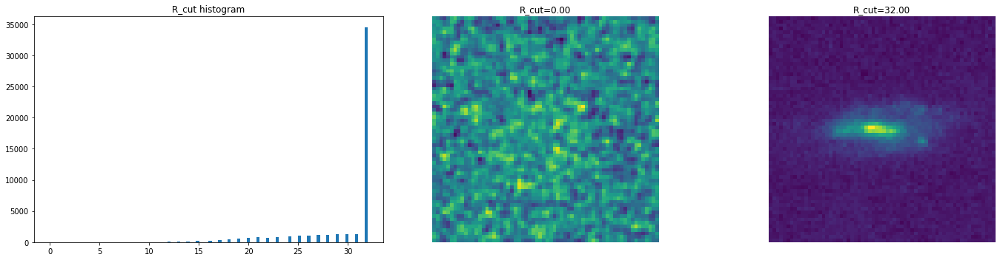

In [12]:
overview.Show_stats(galaxies,df,'R_cut',0,np.inf,2,False,True,False)

R_cut 0.0
Number of galaxies 48795


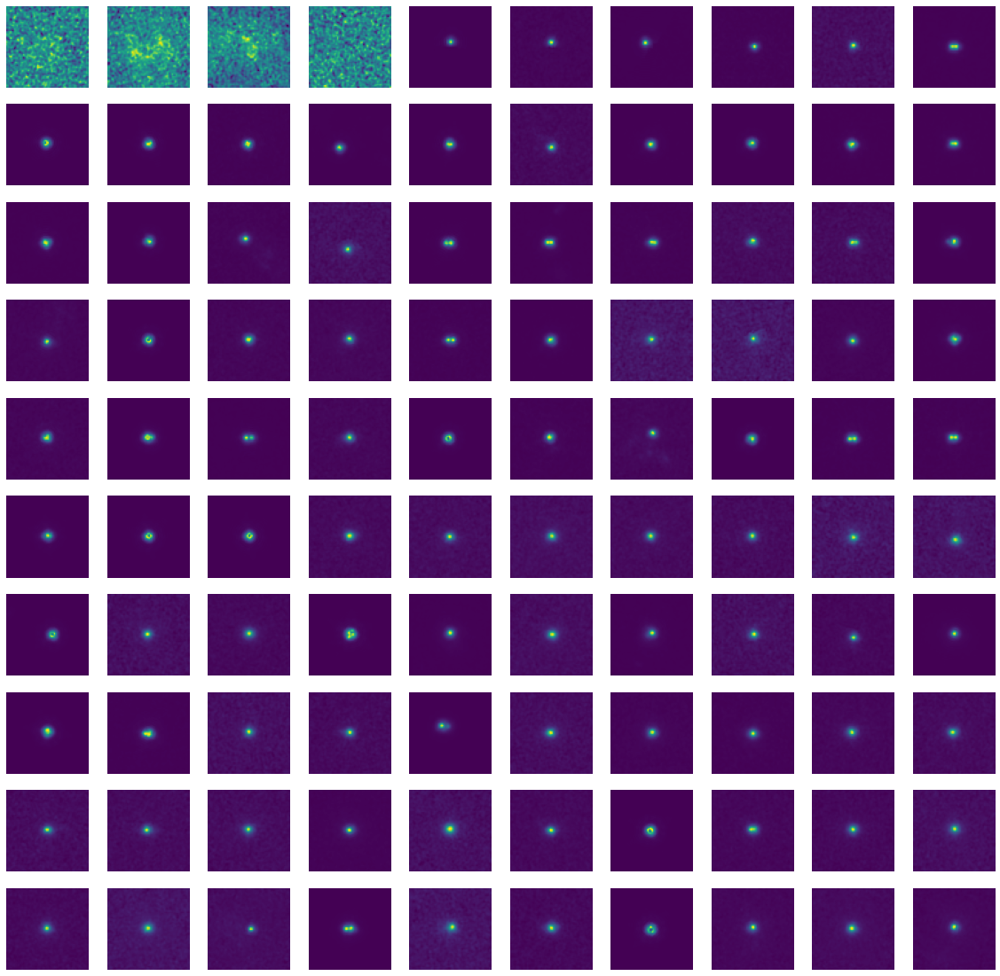

In [13]:
df_filt=overview.Show_filtered(galaxies,df,'R_cut',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

## NonUniformity

48795 Galaxies
NonUniformity [0.00,inf]


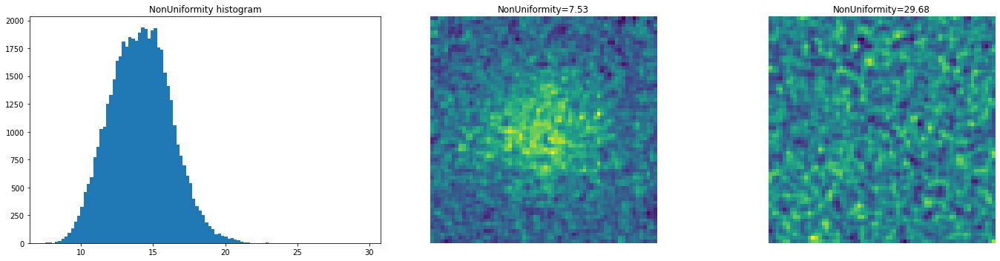

In [14]:
overview.Show_stats(galaxies,df,'NonUniformity',0,np.inf,2,False,True,False)

NonUniformity 29.67506610954215
Number of galaxies 48795


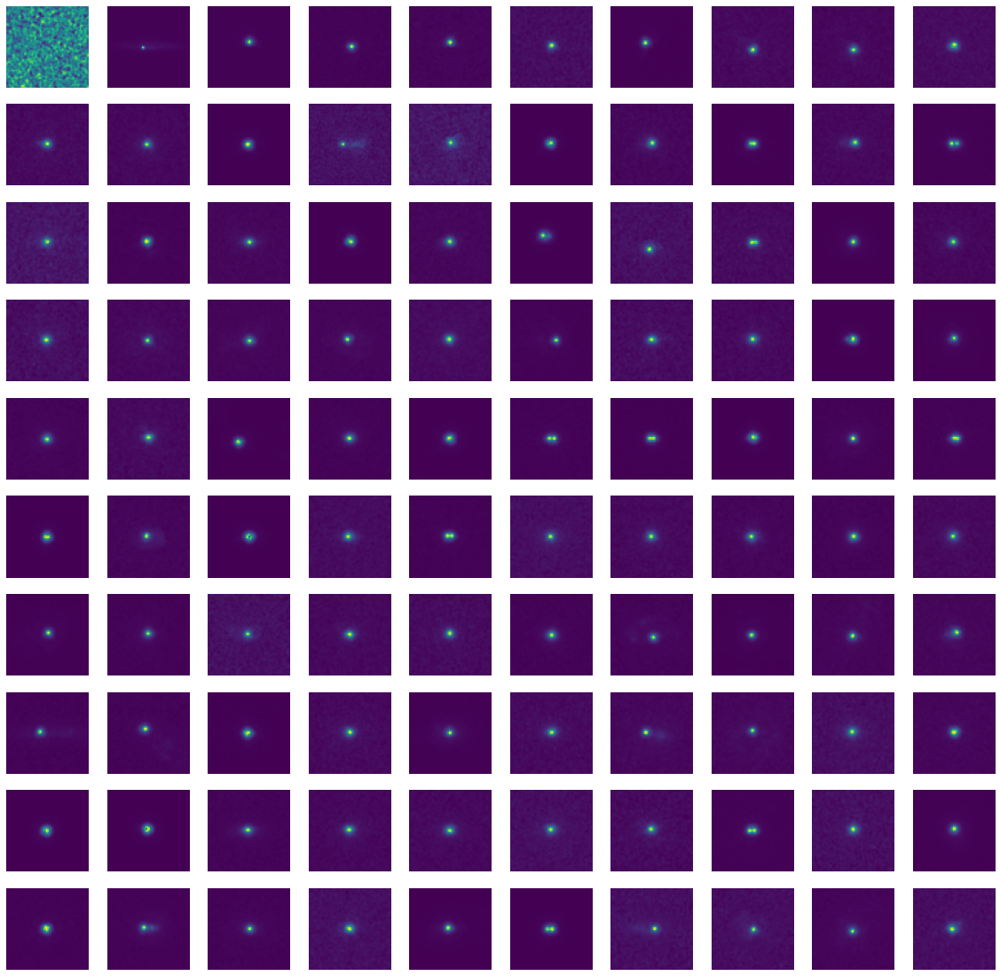

In [15]:
df_filt=overview.Show_filtered(galaxies,df,'NonUniformity',ascending=False,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

## COSMOS_Sersic_n

48687 Galaxies
COSMOS_Sersic_n [0.11,inf]


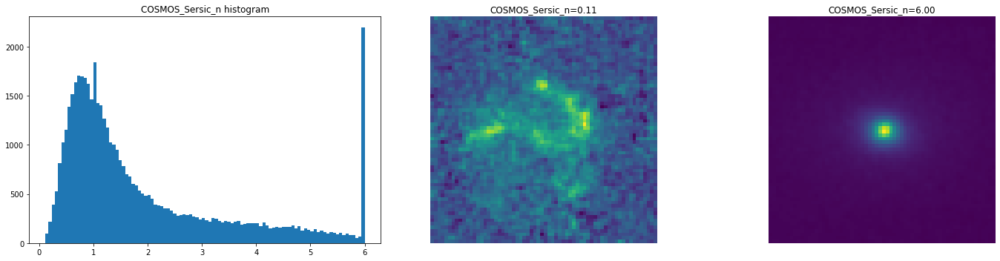

In [16]:
overview.Show_stats(galaxies,df,'COSMOS_Sersic_n',0.11,np.inf,2,False,True,False)

In [83]:
df_mod=df[(df.COSMOS_Sersic_n<6) & (df.NonUniformity<21) & (df.R_cut<32)]

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


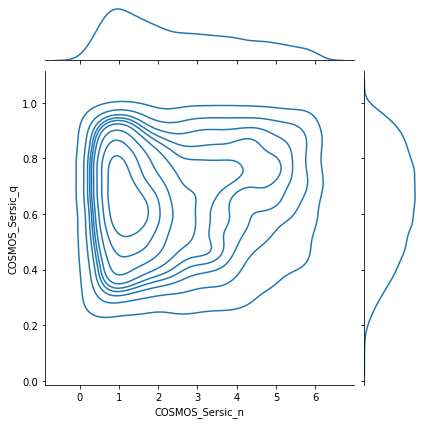

In [84]:
sns.jointplot(df_mod.COSMOS_Sersic_n,df_mod.COSMOS_Sersic_q,kind='kde')

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


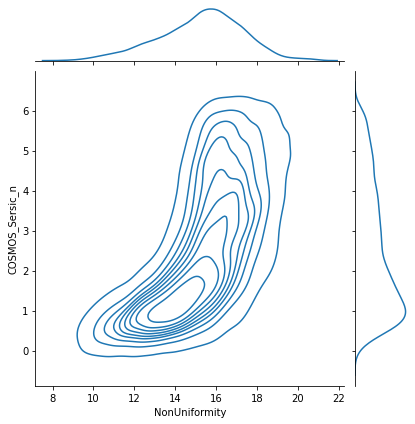

In [85]:
sns.jointplot(df_mod.NonUniformity,df_mod.COSMOS_Sersic_n,kind='kde')

I'd say that starting from Sersic_n>3 the behaviour becomes unusual

In [ ]:
mask_dot_like=((df.NonUniformity>=13) & (df.COSMOS_Sersic_n>=2.5)) | (df.R_cut<21)

# Dataset filtering

## Dot-like filter

### R_cut

R_cut 21.0
Number of galaxies 46149


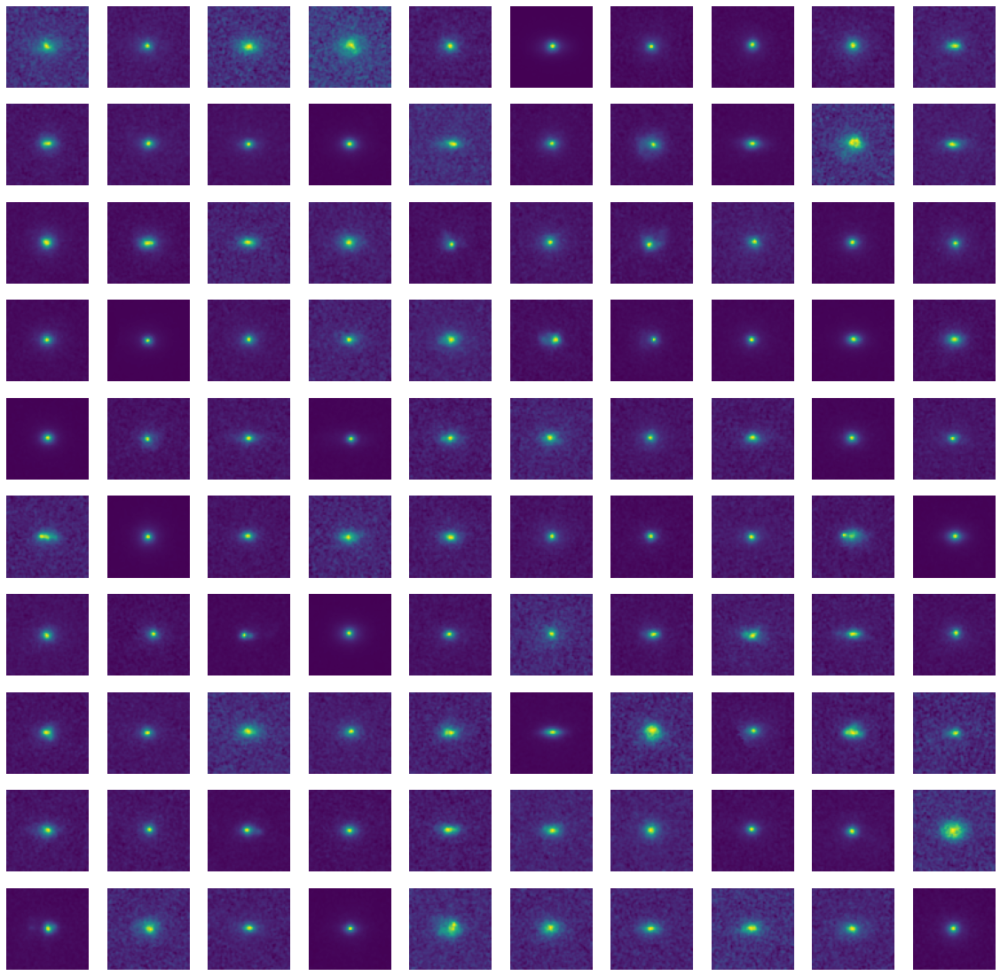

In [22]:
threshold=21
df_filt=overview.Show_filtered(galaxies,df,'R_cut',ascending=True,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

### NonUniformity

NonUniformity 13.999714453755384
Number of galaxies 23307


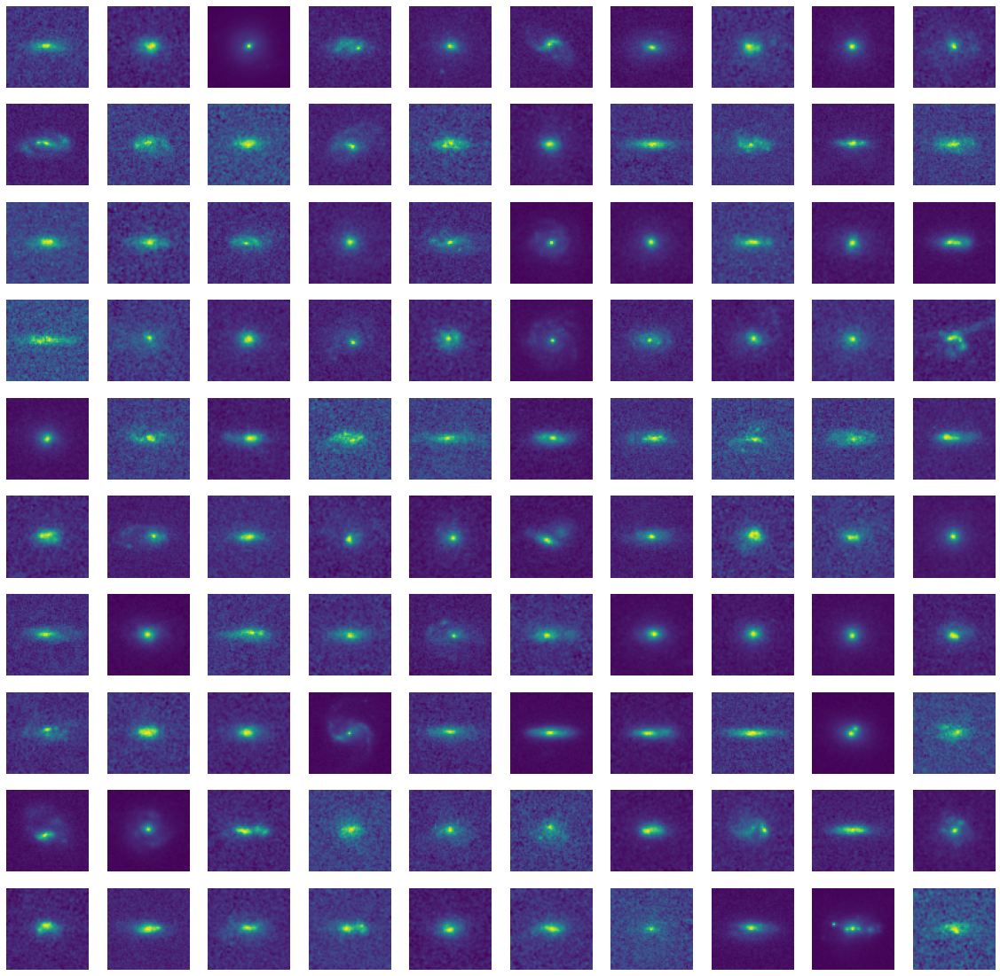

In [24]:
threshold=14
df_filt=overview.Show_filtered(galaxies,df,'NonUniformity',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

### COSMOS_Sersic_n

15903 Galaxies
COSMOS_Sersic_n [2.00,inf]


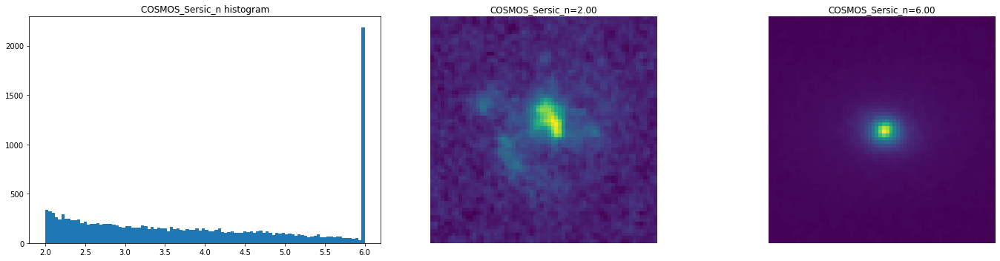

In [26]:
overview.Show_stats(galaxies,df,'COSMOS_Sersic_n',2,np.inf,2,False,False,False)

COSMOS_Sersic_n 2.300234149490555
Number of galaxies 13767


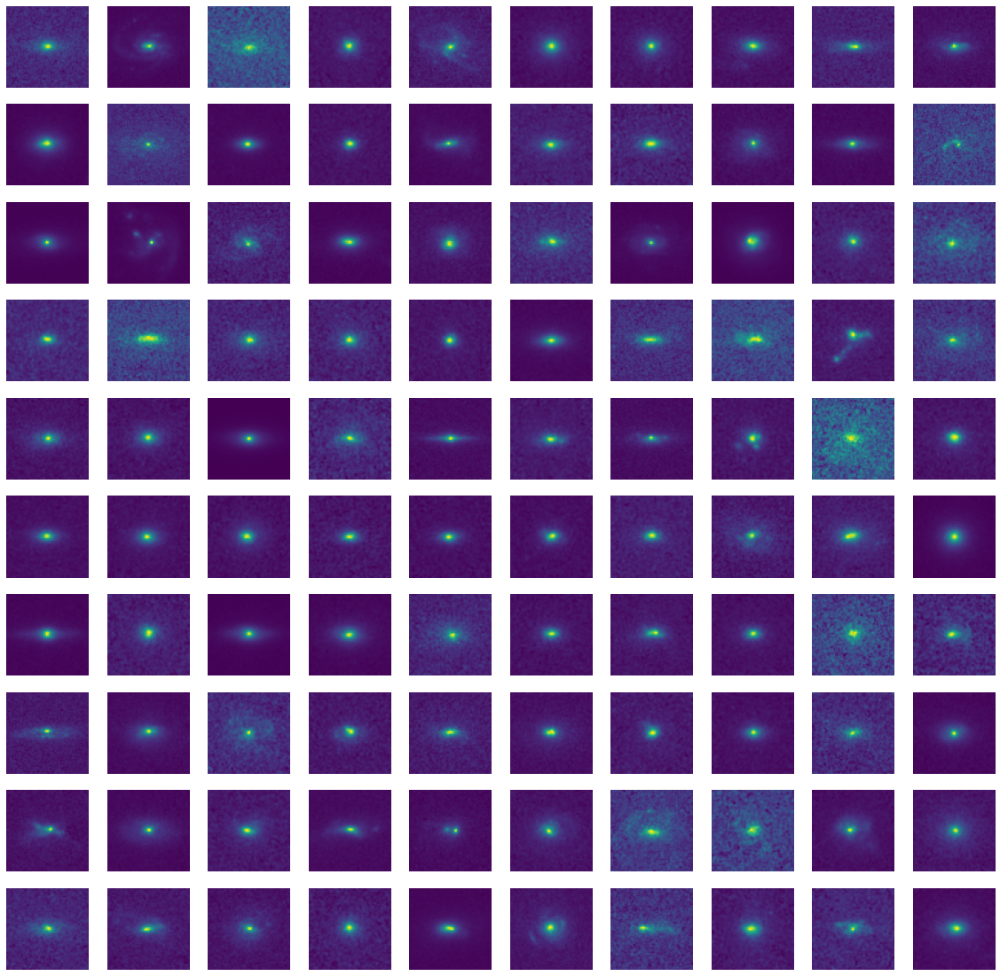

In [27]:
threshold=2.3
df_filt=overview.Show_filtered(galaxies,df,'COSMOS_Sersic_n',ascending=True,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

In [28]:
mask_dot_like=((df.NonUniformity>=13) & (df.COSMOS_Sersic_n>=2.5)) | (df.R_cut<21)

## True dot-like

In [30]:
import seaborn as sns

In [78]:
df_mod=df[(df.COSMOS_Sersic_n<6) & (df.NonUniformity<21) & (df.R_cut<32)]

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


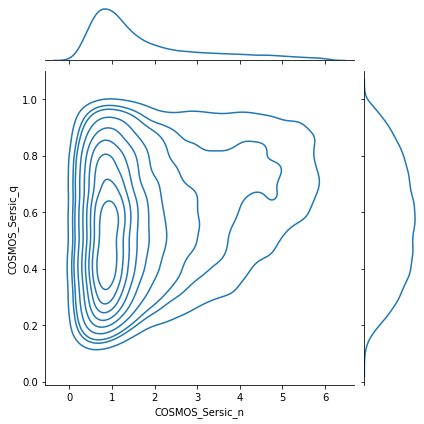

In [73]:
sns.jointplot(df_mod.COSMOS_Sersic_n,df_mod.COSMOS_Sersic_q,kind='kde')

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


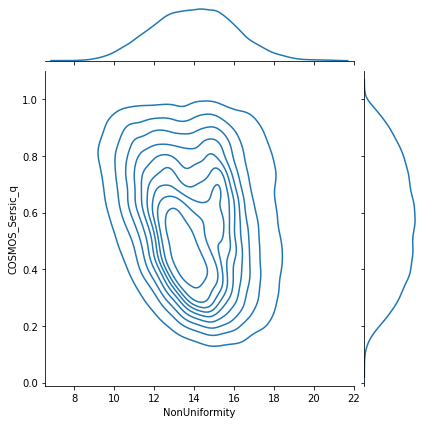

In [76]:
sns.jointplot(df_mod.NonUniformity,df_mod.COSMOS_Sersic_q,kind='kde')

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


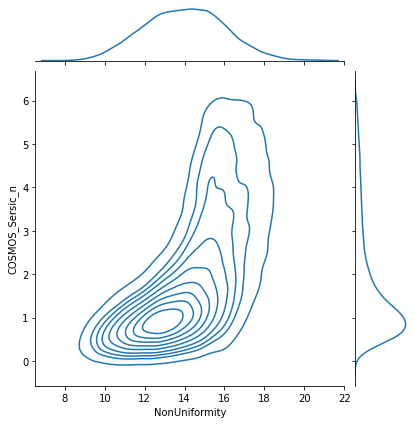

In [75]:
sns.jointplot(df_mod.NonUniformity,df_mod.COSMOS_Sersic_n,kind='kde')

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


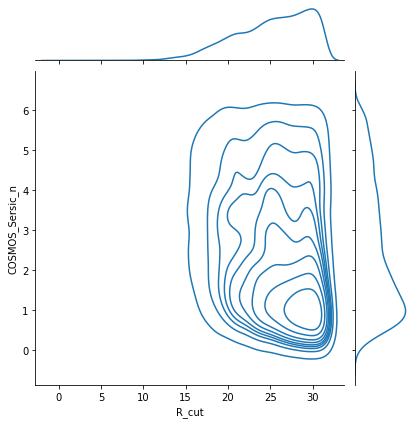

In [79]:
sns.jointplot(df_mod.R_cut,df_mod.COSMOS_Sersic_n,kind='kde')

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


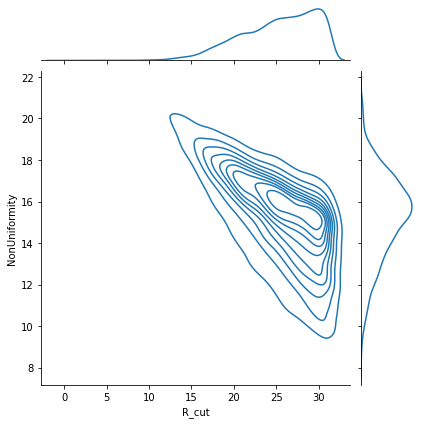

In [89]:
sns.jointplot(df_mod.R_cut,df_mod.NonUniformity,kind='kde')

/usr/local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


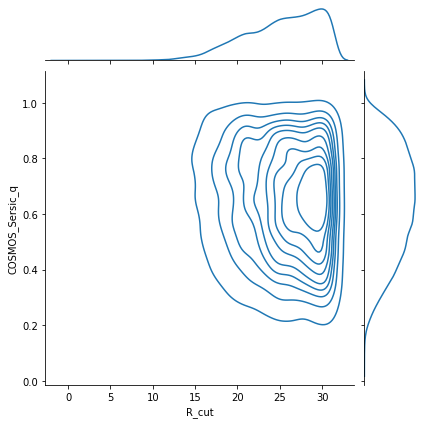

In [95]:
sns.jointplot(df_mod.R_cut,df_mod.COSMOS_Sersic_q,kind='kde')

In [45]:
mask_true_dot=((df.NonUniformity>=2.5) & (df.COSMOS_Sersic_q>0.4))

COSMOS_Sersic_n 6.0
Number of galaxies 37663


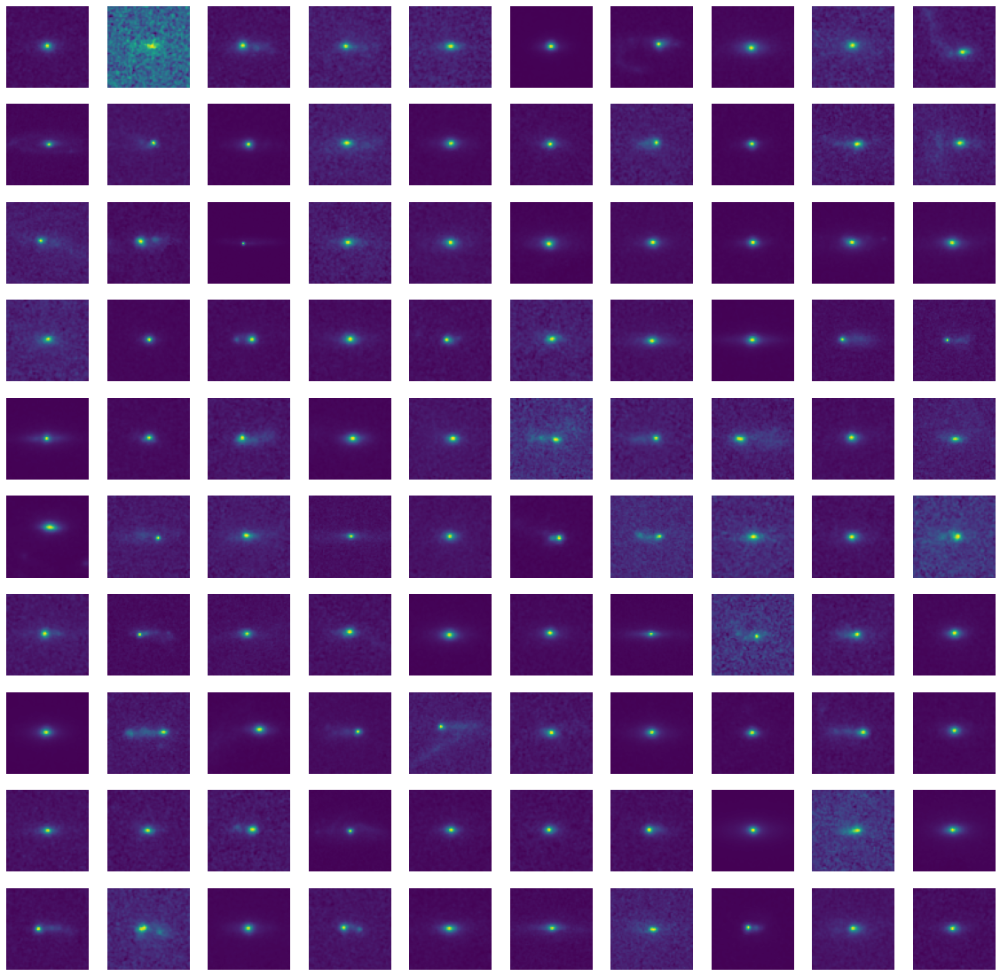

In [53]:
threshold=0
df_filt=overview.Show_filtered(galaxies,df[~mask_true_dot],'COSMOS_Sersic_n',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

## Non Dot-like galaxies

The residual galaxies are likely to have some structure. Not like PSF-spreaded dot-like ones.

NonUniformity 20.749047988619992
Number of galaxies 35451


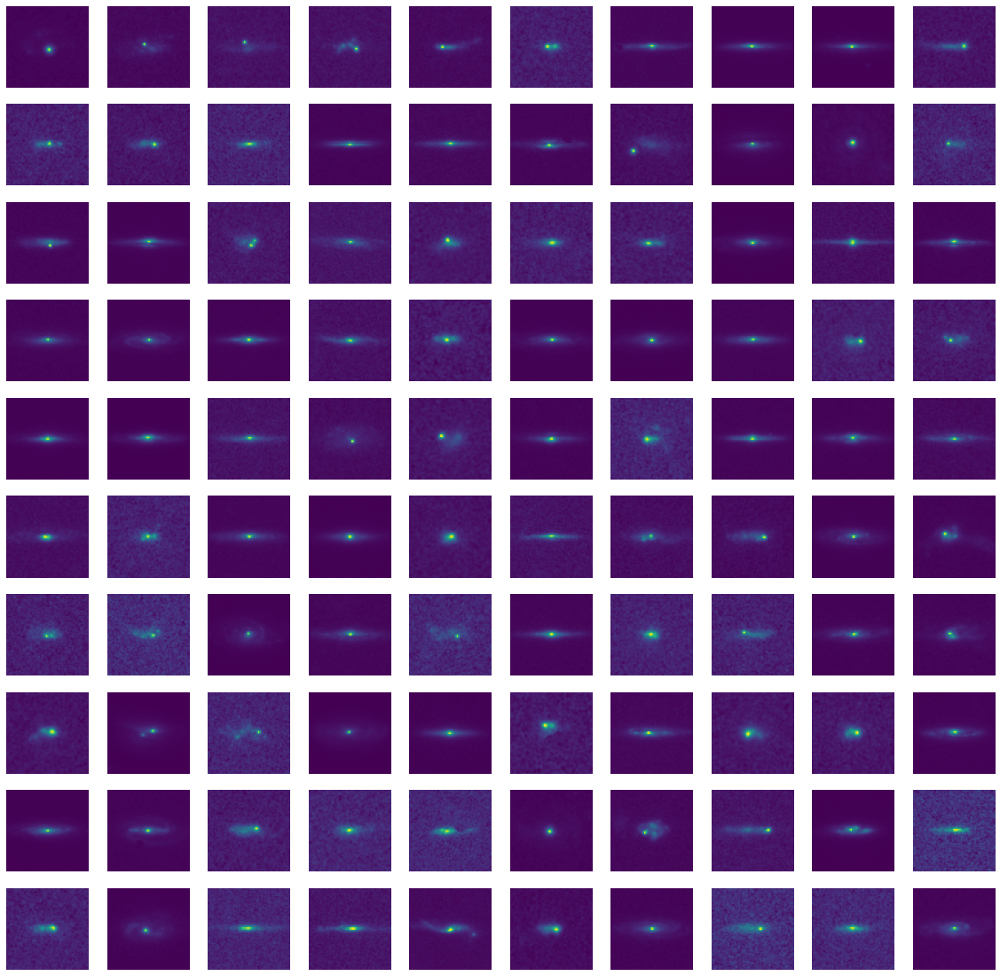

In [29]:
threshold=0
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'NonUniformity',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

COSMOS_Sersic_n 2.2998305278458204
Number of galaxies 34268


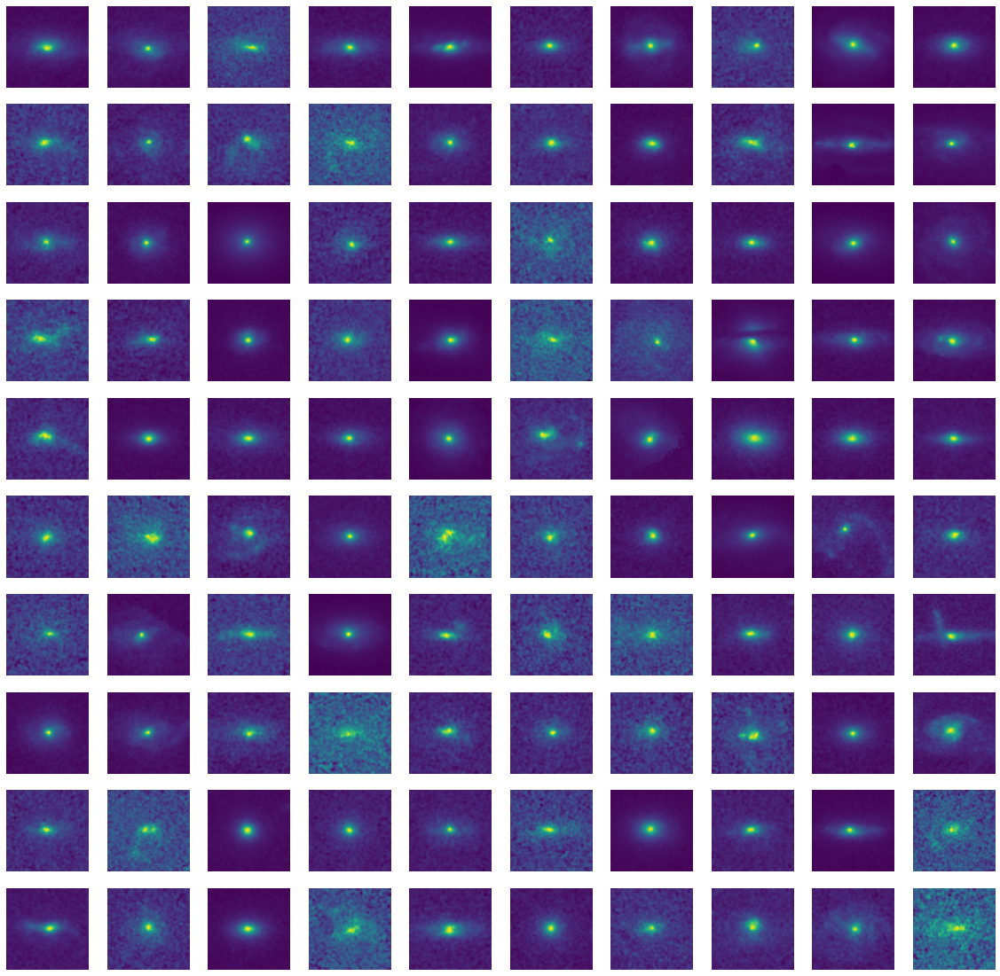

In [28]:
threshold=0
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'COSMOS_Sersic_n',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

## SNR filter

In [ ]:
PSNR=20*log10(max_I/gaussian_sigma)

25475 Galaxies
PSNR [30.00,inf]


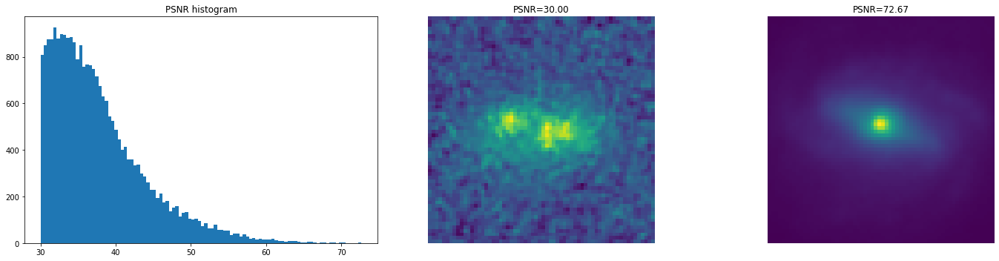

In [29]:
overview.Show_stats(galaxies,df[~mask_dot_like],'PSNR',30,np.inf,2,False,False,False)

25475 Galaxies
PSNR [30.00,inf]


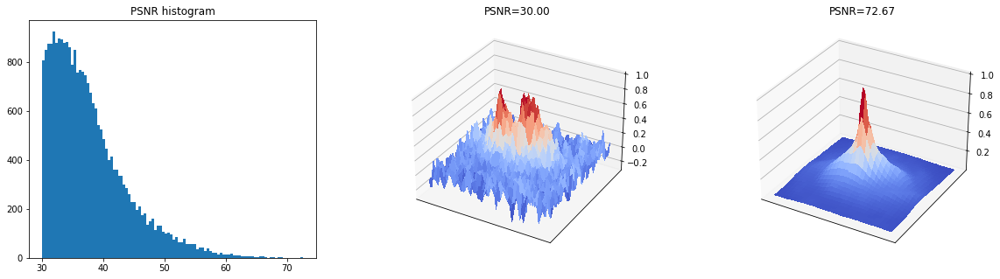

In [30]:
overview.Show_stats(galaxies,df[~mask_dot_like],'PSNR',30,np.inf,3,False,False,False)

In [286]:
from matplotlib import cm

def present_3d_image(image):
  X = np.arange(0, image.shape[0], 1)
  Y = np.arange(0, image.shape[1], 1)
  X, Y = np.meshgrid(X, Y)

  fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
  surf = ax.plot_surface(X, Y, image, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
  ax.set_xticks([])
  ax.set_yticks([])

  plt.figure(3)
  plt.imshow(image,cmap='viridis')
  plt.show()

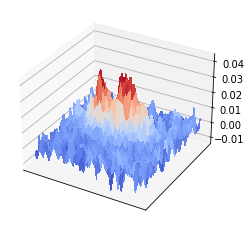

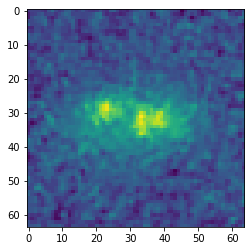

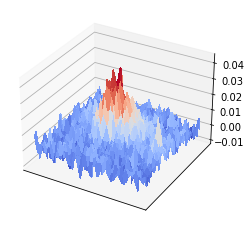

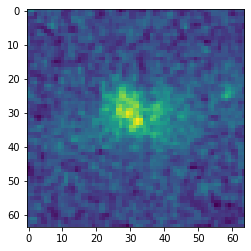

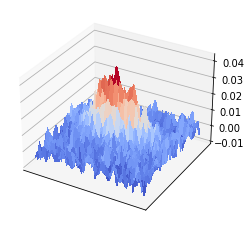

...

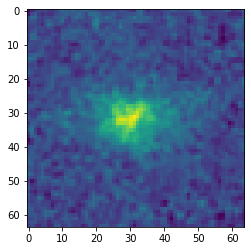

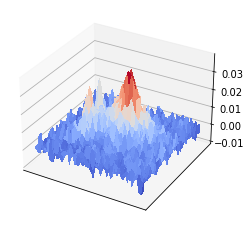

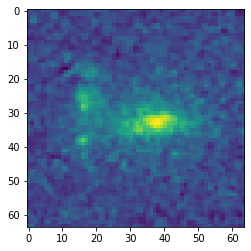

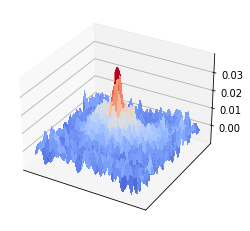

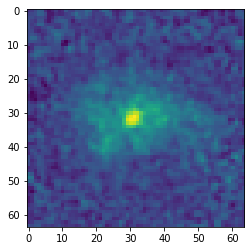

In [287]:
for i in range(10):
    present_3d_image(galaxies[df_filt.iloc[i].name])

PSNR 30.001925432267463
Number of galaxies 25475


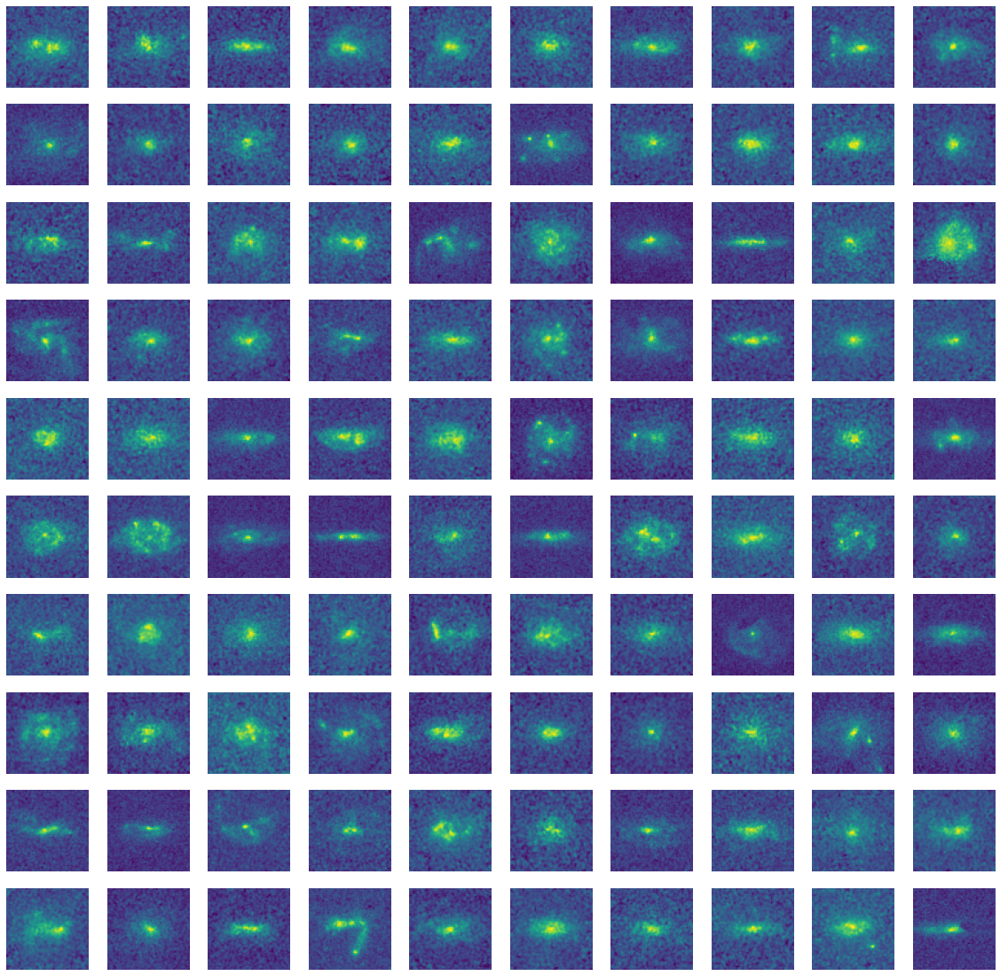

In [31]:
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'PSNR',ascending=True,threshold=30,Index_from=0,invert_colors=False,cut_negatives=False)

I don't think that there is any sense in taking anything below PSNR=30. Let's stick to this value

In [54]:
mask=(df.PSNR>=30) & ~mask_dot_like
print(mask.sum())

25475


# Overview of filtered dataset

PSNR 30.001925432267463
Number of galaxies 25475


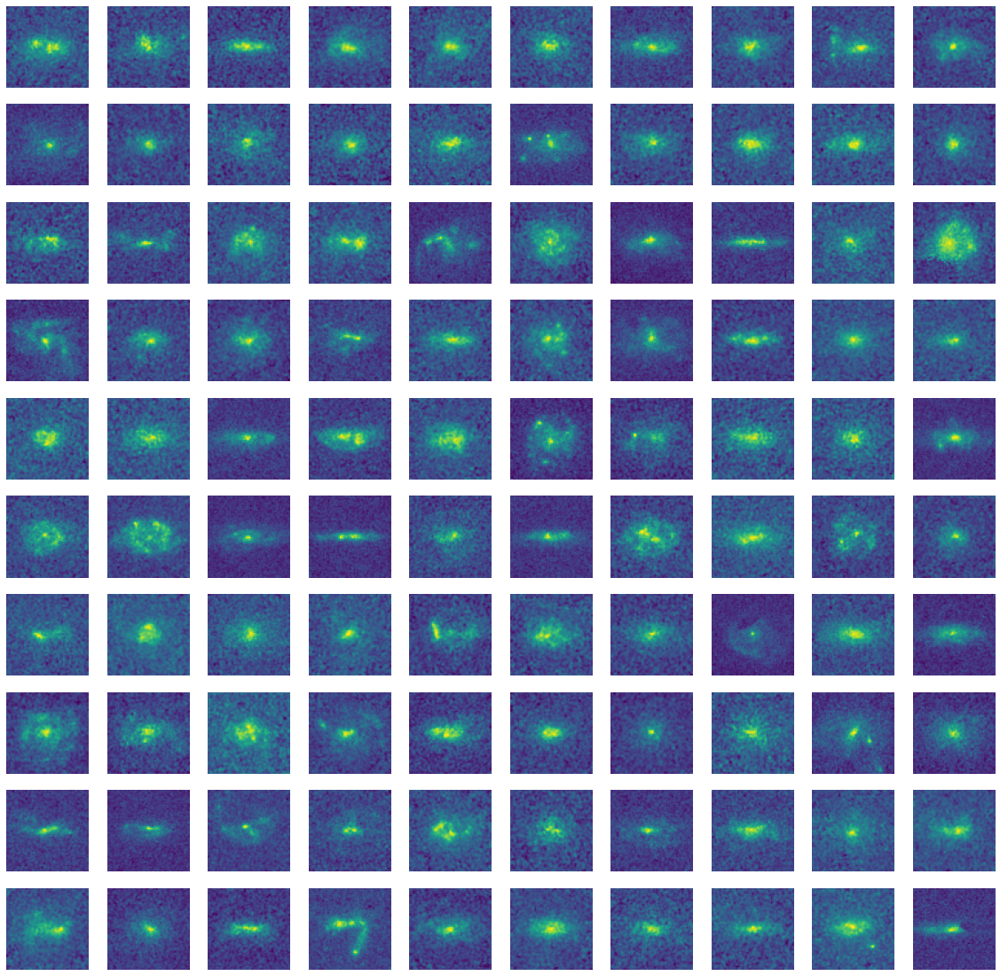

In [55]:
df_filt=overview.Show_filtered(galaxies,df[mask],'PSNR',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

NonUniformity 7.128164386083515
Number of galaxies 25475


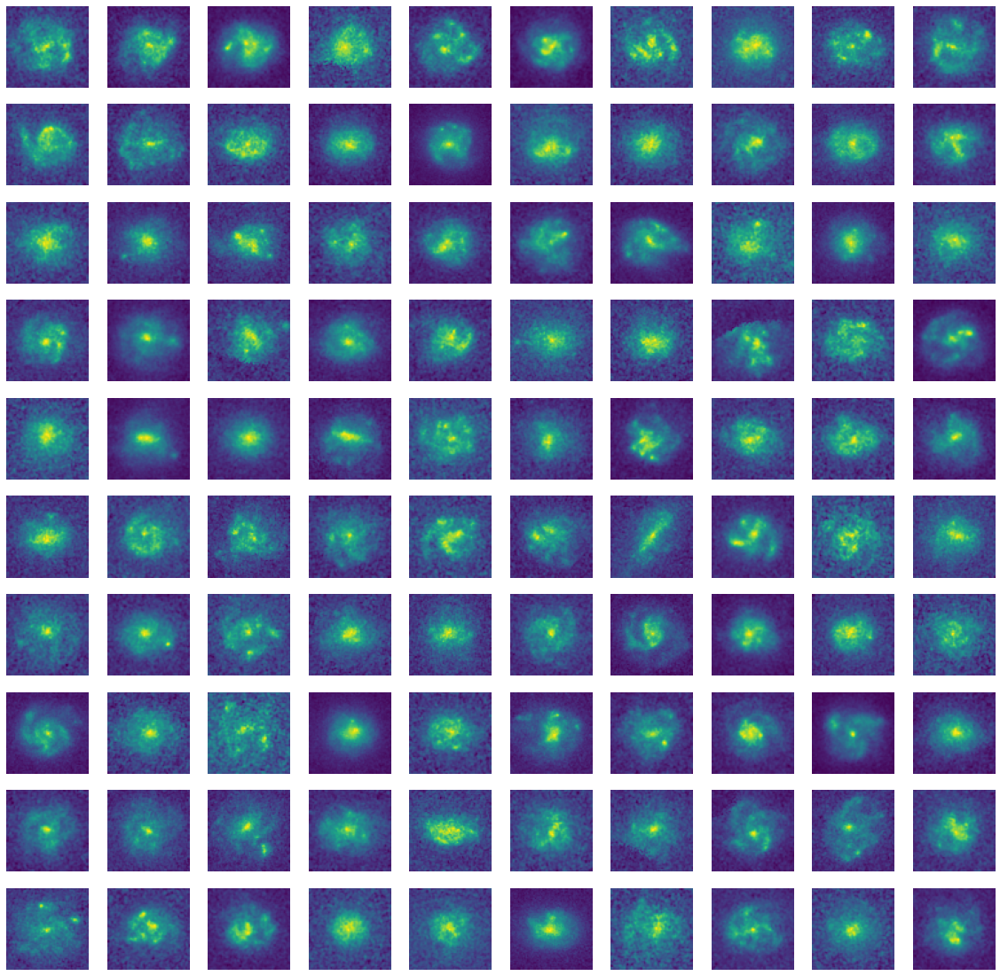

In [56]:
df_filt=overview.Show_filtered(galaxies,df[mask],'NonUniformity',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)